# Starsim tutorial

#### A step by step tutorial on using starsim

## What is starsim?
Starsim is a tool to simulate photometry and spectroscopy of a spotted rotating star. It has two main modes:
* **Forward mode**: From a custom spot map and stellar parameters, allows simulating photometry (light curves at different bandpass) and spectroscopy (RV, FWHM, BIS, contrast, CRX) at the desired times of observation.
* **Inverse mode**: From multiple (or single) time series of different observables and instruments, derive the spot map and the stellar parameters that best reproduce the input parameters.

## 1.- Installation

**WARNING**: Before installation, be aware that starsim can be only executed using Python 3.X, so make sure it is your default version. Otherwise, you can create a new enviroment with [anaconda](https://docs.conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html) or alternatively, in the following steps use `pip3` instead of `pip` and run any script with `python3 script.py` instead of `python script.py`.

Starsim can be downloaded from github, and installed using pip. Simply run:
```
git clone https://github.com/dbarochlopez/starsim.git
cd starsim
pip install .
```
Now starsim is installed and can be imported from any location.

## 2.-Downloading models
The main engine of starsim is based on synthetic spectra to generate the surface grid. In order to work, starsim needs two types of models, high-resolution models and intensity models, both based on the stellar atmosphere code PHOENIX ([Allard & Hauschildt 1995](https://ui.adsabs.harvard.edu/abs/1995ApJ...445..433A/abstract)) computed by [Husser et al. (2013)](https://www.aanda.org/articles/aa/full_html/2013/05/aa19058-12/aa19058-12.html#R1).

You can download them from https://www.ice.csic.es/owncloud/s/7kRTAJqKHxeHB3w, and replace the _starsim/models_ folder with the downloaded folder. The downloaded models contains temperatures from 2300K to 5500K, and surface gravities from 3.5 to 6.0. If a wider grid of temperatures and/or surface gravities are needed, the high resolution models can be found in http://phoenix.astro.physik.uni-goettingen.de/data/HiResFITS/PHOENIX-ACES-AGSS-COND-2011/Z-0.0/ (store them in models/Phoenix) and the intensity models in http://phoenix.astro.physik.uni-goettingen.de/data/SpecIntFITS/PHOENIX-ACES-AGSS-COND-SPECINT-2011/Z-0.0/ (store them in models/Phoenix_mu). **IMPORTANT**: if you download a new high-resolution model to models/Phoenix, the corresponding intensity model must be downloaded to models/Phoenix_mu, and vice versa. In case a model is missing, starsim will let you know.

Additionaly, the folder _starsim/models/filters_ contains some files with the bandpass of different instruments (TESS, Kepler, etc.). If you want to use different filters, you can create your own file, or download [here](http://svo2.cab.inta-csic.es/svo/theory/fps3/) the bandpass of the desired instrument.

## 3.- Setting up the configuration files

The definition of the stellar parameters, the spot map, and other options is made through two main files in the _starsim_ folder: starsim.conf and spotmap.dat.

* **starsim.conf**: used to set the stellar parameters and different modes and options of the simulation. The file is intended to be self-explanatory.
* **spotmap.dat**: used to define the spots appearence, lifetime, position, and radius. Each row correspond to a different spot. There are 14 columns. The first seven columns are: 1-Appearence time, 2-Lifetime, 3-Colatitude, 4-longitude (at the ref. time set in starsim.conf) 5,6,7-Coefficients determining the evolution of the radius of the spot, the behaviour depends on the _spots_evo_law_ set in starsim.conf (_spots_evo_law_=constant will only use column 5, and the radii will be constant. _spots_evo_law_=linear will use columns 5 and 6, and the radii will evolve from the value in column 5 to the value in column 6. More evolution laws will be added in the future. Columns 8 to 14  are only used in the inversion mode. They are related to the parameter 7 columns to the left, and are flags indicating if the parameter of the spot will be fixed (0) or optimized (1). E.g., column 9 of row 3 set to 1 means that the lifetime (column 2) of spot 3 (row 3) will be optimized.

## 4.- Starting the program

starsim can be executed from your terminal or through a python script. First, you have to import the starsim module and define an starsim object containing the info in starsim.conf and spotmap.dat.


In [79]:
import starsim

ss=starsim.StarSim(conf_file_path='starsim.conf')

The object ss now contains all the info in starsim.conf and spotmap.dat. After ss is defined, the options and spotmap can be accesed and modified without the need of rewriting the files, using ss.NAME_PARAM, with NAME_PARAM equal to the parameter name in starsim.conf. Lets check the current value of the rotation period and modify it to 2.5 days.

Likewise, we can check and modify the spot map by using the command ss.spot_map. Lets check the colatitude of the first spot. The first index corresponds to the row, and the second index to the column. Remember that the first index in python is 0.

In [83]:
print('The first spot (index 0) is at a colatitude (index 2) of:')
print(ss.spot_map[0][2])

The first spot (index 0) is at a colatitude (index 2) of:
45.0


Before starting with the modeling, it is convenient to explain the two main modes of creating the surface grid available in starsim, which can be selected under the _simulation_mode_ keyword in starsim.conf.
* **Fast**: The stellar surface is simulated by a grid of photosphere elements with the same temperature and different limb darkening. Spots and faculae is treated as a single grid element, with properties defined by the coordinates of the central coordinate. This mode is relatively fast, but it is not recommended for spots with radii larger than 15-20 deg. The projected fillingfactor is not affected by this mode as it is analitically computed. 
* **Grid**: The stellar surface is simulated by a grid of different elements (spot, photosphere and facule), to which we assign the corresponding spectra and limb darkening. This option is a bit slower than the fast mode, but should be used for large spots, since different parts of the same spot have noticeabily different limb darkening/spectra. The size of the grid elements is controled by the ``n_grid_rings`` keyword. The width of a grid will be $180/(2\cdot n\_grid\_rings-1)$, in deg. For a decent computing time to resolution ratio, use a number of grids equal to $\max\{10,int(120/R)\}$, with R equal to the radius (in deg) of the smallest spot.

## 5.- Forward modeling

With the forward modeling, the user defines a spot map and a set of stellar parameters, and starsim simulates different observables at the required time stamps.

First, we import starsim and create the starsim object, as before. Then we create a simple spot map, with one 5 deg spot in the equator born at t=-1 and a liftime of 40 days.


## Testing StarSim Code:

In [99]:
import starsim 
import numpy as np
import matplotlib.pyplot as plt
#Create starsim objec, reads starsim.conf and spotmap.dat
ss=starsim.StarSim(conf_file_path='starsim.conf')
period= 14.5
max_frame = 400
ss.rotation_period=period
#Create a simple spot map. Only one spot. We initialize the map with all zeros.
ss.spot_map=np.zeros([1,14]) #One row, 14 columns. 14 columns are mandatory, the number of rows is the number of spots.
ss.spot_map[0][0]=-1 #appearence time in t=-1
ss.spot_map[0][1]=40 #lifetime of 40 days
ss.spot_map[0][2]=45 #colatitude 90 deg
ss.spot_map[0][3]=270
ss.spot_map[0][4]=15 #spotsize 5 deg (using constant evo. law)

Then we execute the forward model, giving the times at which we want to simulate, and the observables we want, in this case the lightcurve, the radial velocities and the fwhm.

In [107]:
t_sampling=np.linspace(0,period/2,max_frame) #sampling times
steps_sampling = np.arange(-18.0, 18.0 + 0.25, 0.25) 
ss.compute_forward(observables=['rv'],t=t_sampling) #Available observables: (lc,rv,crx). bis, fwhm and contrast are aliases of rv.

Date 7.25. ff_ph=99.573%. ff_sp=0.427%. ff_fc=0.000%. ff_pl=0.000%. [400/400]%%. [399/400]%%

In [108]:
for etiqueta in ss.results.keys():
    print(etiqueta)

#len(steps_plot)
print(ss.results['CCF'].shape)

time
rv
contrast
fwhm
bis
ff_ph
ff_sp
ff_pl
ff_fc
CCF
(401, 145)


### Results plot

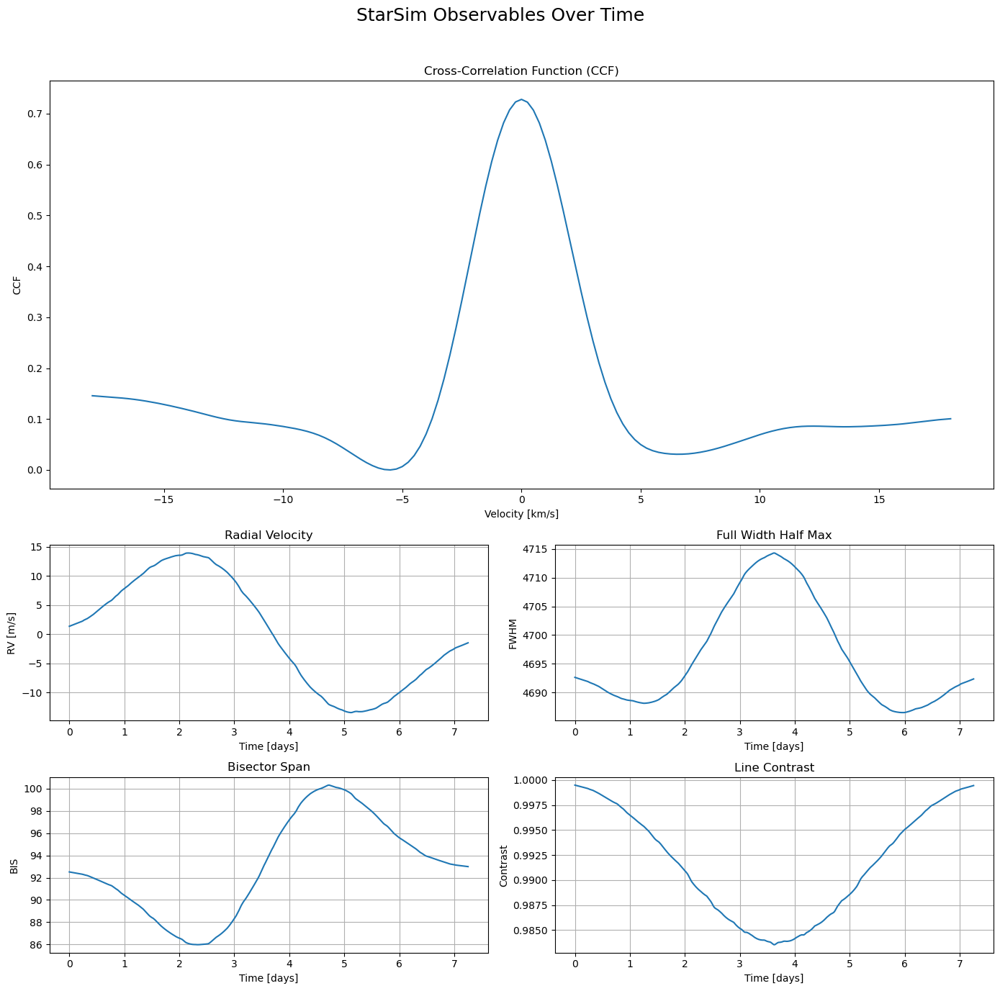

In [112]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(14, 14))
gs = gridspec.GridSpec(4, 2, figure=fig)

# Primer subplot: CCF ocupa tota la meitat superior (2x2)
ax0 = fig.add_subplot(gs[0:2, 0:2])  # ocupa files 0 i 1, columnes 0 i 1
ax0.plot(steps_sampling, ss.results['CCF'][390])
ax0.set_xlabel('Velocity [km/s]')
ax0.set_ylabel('CCF')
ax0.set_title('Cross-Correlation Function (CCF)')

# Subplots de la meitat inferior (2x2)
ax1 = fig.add_subplot(gs[2, 0])
ax1.plot(t_sampling, ss.results['rv'])
ax1.set_xlabel('Time [days]')
ax1.set_ylabel('RV [m/s]')
ax1.grid(True)
ax1.set_title('Radial Velocity')

ax2 = fig.add_subplot(gs[2, 1])
ax2.plot(t_sampling, ss.results['fwhm'])
ax2.set_xlabel('Time [days]')
ax2.set_ylabel('FWHM')
ax2.grid(True)
ax2.set_title('Full Width Half Max')

ax3 = fig.add_subplot(gs[3, 0])
ax3.plot(t_sampling, ss.results['bis'])
ax3.set_xlabel('Time [days]')
ax3.set_ylabel('BIS')
ax3.grid(True)
ax3.set_title('Bisector Span')

ax4 = fig.add_subplot(gs[3, 1])
ax4.plot(t_sampling, ss.results['contrast'])
ax4.set_xlabel('Time [days]')
ax4.set_ylabel('Contrast')
ax4.grid(True)
ax4.set_title('Line Contrast')

fig.suptitle('StarSim Observables Over Time', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # deixa espai pel títol
plt.savefig('results_AU_micro.png')
plt.show()



#### Animation plot of CCFs evolution

In [116]:
%matplotlib inline
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
line, = ax.plot([], [], color='blue')
ax.set_xlim(min(steps_sampling), max(steps_sampling))
ax.set_ylim(0, 0.9)
ax.set_xlabel('Velocity [km/s]')
ax.set_ylabel('CCF')
ax.set_title('Cross-Correlation Function (CCF)')

# Initialization function
def init():
    line.set_data([], [])
    return line,

# Update function for each frame
def update(frame):
    y = ss.results['CCF'][frame]
    line.set_data(steps_sampling, y)
    ax.set_title(f'CCF Frame {frame} / {max_frame}')
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=range(1,max_frame), init_func=init,
                    interval=10, blit=True)

# Save the animation as MP4
output_path = "CCF_animation.mp4"
ani.save(output_path, writer='ffmpeg', fps=10)
plt.close(fig)

# Display it in a Jupyter notebook
HTML(ani.to_jshtml())


The plots can be automatically generated using the method `ss.plot_forward_results()`. The plot will be saved under the _starsim/plots_ folder. Lets show it with a little trick:

## Type K stars CCFs

In [73]:
import starsim
import numpy as np
import matplotlib.pyplot as plt
import time
from joblib import Parallel, delayed
import multiprocessing
import math
from pathlib import Path

def processInput(i,ss):
    period = np.random.uniform(10.,50.)
    max_frame = 400
    ss.rotation_period = period
    ss.spot_T_contrast = np.random.uniform(250.,1000.)
    ss.convective_shift = np.random.uniform(0.5, 1.5)
    ss.differential_rotation = np.random.uniform(0., 2.)
    ss.inclination = np.arcsin(np.random.uniform(0,1))
    
    t=np.linspace(0,period/2,max_frame) #sampling times
    #tmax = t.max()
    
    #ss.temperature_photosphere = np.random.uniform(4000.,5000.)
    #ss.mass = np.random.uniform(0.60,0.75)
    #ss.radius = np.random.uniform(0.60,0.75)
    #ss.logg = np.random.uniform(4.5,4.75)

    ss.spot_map=np.zeros([1,14]) #One row, 14 columns. 14 columns are mandatory, the number of rows is the number of spots.
    ss.spot_map[0][0]=-1 #appearence time in t=-1
    ss.spot_map[0][1]=40 #lifetime of 40 days
    ss.spot_map[0][2]=90.+180./np.pi*(np.arccos(np.random.uniform(0,1))-np.arccos(np.random.uniform(0,1)))
    ss.spot_map[0][3]=270 #fixat
    ss.spot_map[0][4]=np.random.uniform(5,19) #spotsize 5 deg (using constant evo. law)
    # This is if you need MORE SPOTS for testing
    #overlap=True
    #while overlap: 
        #Nspots=1#int(np.random.uniform(15,20))
        #ss.spot_map=np.zeros([Nspots,7])
        #lifetime=np.random.uniform(25.,150.)
        #for j in range(Nspots):
        #    ss.spot_map[j][0]=np.random.uniform(-ss.rotation_period,tmax)
        #    ss.spot_map[j][1]=np.random.uniform(25.,150.)# lifetime#
        #    ss.spot_map[j][2]=90.+180./np.pi*(np.arccos(np.random.uniform(0,1))-np.arccos(np.random.uniform(0,1)))
        #    ss.spot_map[j][3]=np.random.uniform(0,360) #longitude		
        #    ss.spot_map[j][4]=np.random.uniform(3,4) #spot radius

        #overlap=starsim.nbspectra.check_spot_overlap(ss.spot_map,0) #true if spots are overlapping

    ss.compute_forward(observables=['rv'],t=t)
    rv=ss.results['rv'] 
    bi=ss.results['bis']

    flag_rv,flag_bi=0,0
    for j in range(len(t)):
        if math.isnan(bi[j]): flag_bi=1
        if rv[j]==0.: flag_rv=1

    if flag_bi==0 and flag_rv==0:

        file_out=open('SSmodels_list.txt','a')
        file_out.write(str(i)+' '+str(ss.rotation_period)+' '+str(ss.mass)+' '+str(ss.radius)+' '+str(ss.logg)+' '+str(ss.temperature_photosphere)+' '+str(ss.spot_T_contrast)+' '+str(ss.inclination)+' '+str(ss.convective_shift)+' '+str(ss.differential_rotation)+'\n')
        file_out.close()

        np.savetxt('SS_models/sim_{}.txt'.format(i),np.array([ss.results['rv'],ss.results['bis'],ss.results['fwhm'],ss.results['contrast']]).T,fmt='%.10f')
        cff_data = ss.results['CCF'][1:max_frame+1].T
        np.savetxt('SS_CFF/sim_{}.txt'.format(i), cff_data, fmt='%.10f')

        if (i % 10000 == 0): print(i)

        '''
        fig = plt.figure(figsize=(6, 6))
        ax1 = plt.subplot2grid((4, 1), (0, 0))
        ax2 = plt.subplot2grid((4, 1), (1, 0))
        ax3 = plt.subplot2grid((4, 1), (2, 0))
        ax4 = plt.subplot2grid((4, 1), (3, 0))
        ax1.plot(t,rv,'ko',markersize=1)
        ax2.plot(t,bi,'ko',markersize=1)
        ax3.plot(t,fw,'ko',markersize=1)
        ax4.plot(t,co,'ko',markersize=1)
        plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
        plt.savefig('example_curves'+str(i)+'.png', orientation='landscape', dpi=300)
        plt.close()
        '''

    if flag_bi == 1:
        file_out2 = open('SSmodels_list_biswrong.txt', 'a')
        file_out2.write(
            str(i) + ' ' + str(ss.rotation_period) + ' ' + str(ss.mass) + ' ' + str(ss.radius) + ' ' + str(
                ss.logg) + ' ' + str(ss.temperature_photosphere) + ' ' + str(ss.spot_T_contrast) + ' ' + str(
                ss.inclination) + ' ' + str(ss.convective_shift) + ' ' + str(ss.differential_rotation) + '\n')
        file_out2.close()

start=time.time()
Nsims=100
ss=starsim.StarSim(conf_file_path='starsim.conf')
num_cores = multiprocessing.cpu_count()

Parallel(n_jobs=num_cores)(delayed(processInput)(i,ss) for i in range(Nsims))


Date 12.637836418663804. ff_ph=99.957%. ff_sp=0.043%. ff_fc=0.000%. ff_pl=0.000%. [400/400]%0 
Date 12.074310209927422. ff_ph=99.889%. ff_sp=0.111%. ff_fc=0.000%. ff_pl=0.000%. [338/400]%  

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]